In [3]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Read data
portfolio = pd.read_json('data/portfolio.json', orient='records', lines=True)
profile = pd.read_json('data/profile.json', orient='records', lines=True)
transcript = pd.read_json('data/transcript.json', orient='records', lines=True)

# 1.Explore data

In [5]:
portfolio

,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7
5,3,"[web, email, mobile, social]",7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2
6,2,"[web, email, mobile, social]",10,10,discount,fafdcd668e3743c1bb461111dcafc2a4
7,0,"[email, mobile, social]",0,3,informational,5a8bc65990b245e5a138643cd4eb9837
8,5,"[web, email, mobile, social]",5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d
9,2,"[web, email, mobile]",10,7,discount,2906b810c7d4411798c6938adc9daaa5


In [6]:
profile.head()

,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [7]:
transcript.head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


# 2.Cleaning Data

In [8]:
portfolio['channels'].unique

<bound method Series.unique of 0         [email, mobile, social]
1    [web, email, mobile, social]
2            [web, email, mobile]
3            [web, email, mobile]
4                    [web, email]
5    [web, email, mobile, social]
6    [web, email, mobile, social]
7         [email, mobile, social]
8    [web, email, mobile, social]
9            [web, email, mobile]
Name: channels, dtype: object>

In [9]:
total_channels = ['email', 'mobile', 'social', 'web']

In [10]:
# One hot encode
for channel in total_channels:
    portfolio[channel] = portfolio['channels'].apply(lambda x: 1 if channel in x else 0)
portfolio.drop('channels', axis = 1, inplace=True)

portfolio.head()

,reward,difficulty,duration,offer_type,id,email,mobile,social,web
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1


In [11]:
# Seperate value column in transcript
transcript['value_type'] = transcript['value'].apply(lambda x: list(x.keys())[0])
transcript['value'] = transcript['value'].apply(lambda x: list(x.values())[0])

transcript.head()

,person,event,value,time,value_type
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,offer id
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,offer id
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0,offer id
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0,offer id
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0,offer id


In [12]:
# Replace empty gender values , make income float, and age interger
profile['gender'].fillna('Unknown', inplace = True)
profile['income'] = profile['income'].apply(lambda x: float(x))
profile['age'] = profile['age'].apply(lambda x: int(x))

In [13]:
# Replace empty incomes with mean value
profile['income'].fillna( profile.income.mean() , inplace = True)

In [14]:
# Dropping became_member_on column, and creating new columns representing year,month,date, and member_date
profile['member_year'] = profile.became_member_on.apply(lambda x: int(str(x)[:4]))
profile['member_month'] = profile.became_member_on.apply(lambda x: int(str(x)[4:6]))
profile['member_day'] = profile.became_member_on.apply(lambda x: int(str(x)[6:]))
profile['member_date'] = profile.became_member_on.apply(lambda x: datetime.datetime.strptime(str(x), '%Y%m%d'))
profile.drop('became_member_on', axis = 1, inplace = True)

In [15]:
profile.head()

,gender,age,id,income,member_year,member_month,member_day,member_date
0,Unknown,118,68be06ca386d4c31939f3a4f0e3dd783,65404.991568,2017,2,12,2017-02-12
1,F,55,0610b486422d4921ae7d2bf64640c50b,112000.000000,2017,7,15,2017-07-15
2,Unknown,118,38fe809add3b4fcf9315a9694bb96ff5,65404.991568,2018,7,12,2018-07-12
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,100000.000000,2017,5,9,2017-05-09
4,Unknown,118,a03223e636434f42ac4c3df47e8bac43,65404.991568,2017,8,4,2017-08-04


# 3.Data Anaalysis
- Take a look at the distribution of gender and how gender compares to income.
- Looking at the user subscriptions.
- How the distribution of bogo and discount rewards in customers.

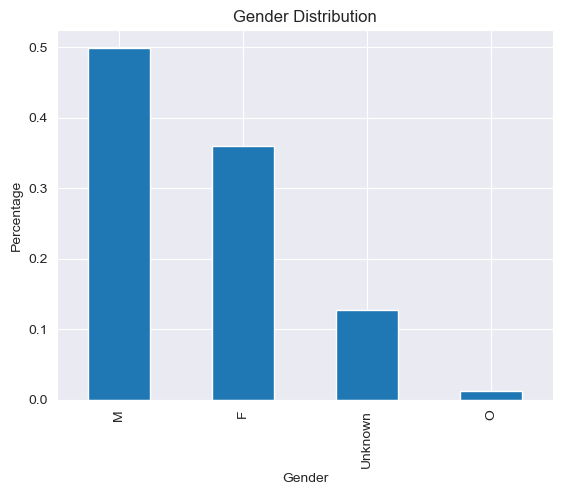

In [16]:
#Take a look at the gender distribution
profile.gender.value_counts(normalize=True).plot(kind='bar')
plt.title('Gender Distribution')
plt.ylabel('Percentage')
plt.xlabel('Gender');

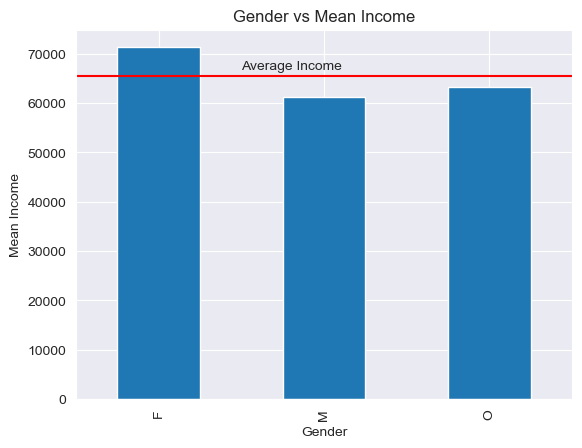

In [17]:
#Income vs Gender Plot
mean_income = profile[profile['gender']!='Unknown'].groupby('gender', as_index=False).agg({'income':'mean'})
mean_income.plot(kind = 'bar', x = 'gender', y = 'income', legend=False)
plt.hlines(profile['income'].mean(), -100 , 1000, colors='red')
plt.text(0.5, profile['income'].mean()+1500, 'Average Income')
plt.ylabel('Mean Income')
plt.xlabel('Gender')
plt.title('Gender vs Mean Income');

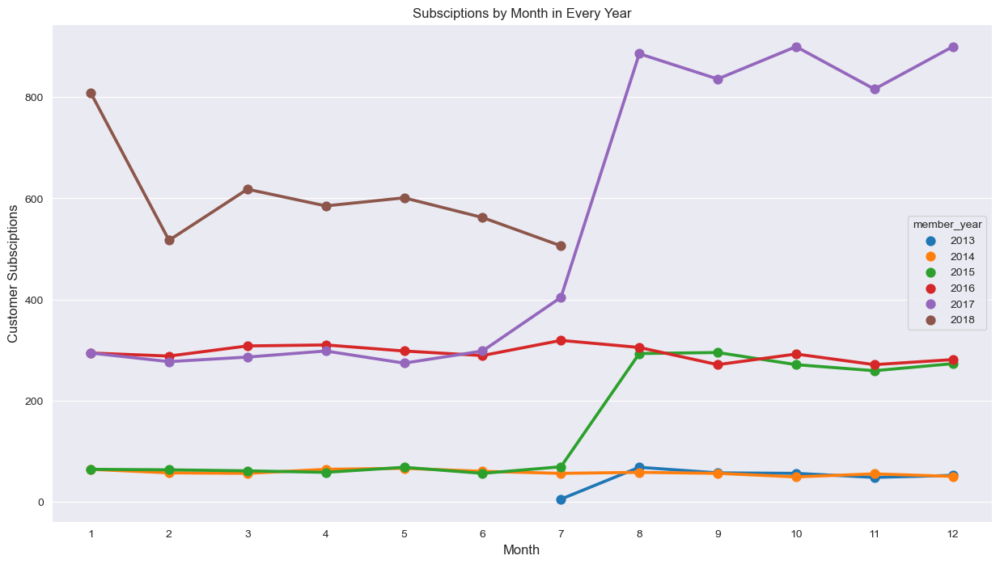

In [18]:
membership_subs =  profile.groupby(['member_year','member_month'],  as_index=False).agg({'id':'count'})
plt.figure(figsize=(15,8))
sns.pointplot(x="member_month", y="id", hue="member_year", data = membership_subs)
plt.ylabel('Customer Subsciptions', fontsize = 12)
plt.xlabel('Month', fontsize = 12)
plt.title('Subsciptions by Month in Every Year');

In [19]:
transcript['value_type'].unique()

array(['offer id', 'amount', 'offer_id'], dtype=object)

In [20]:
transcript[transcript['value_type']=='offer id'].groupby(['event']).agg({'person':'count'})

,person
event,
offer received,76277
offer viewed,57725


In [21]:
# only when 'value_type'== 'offer_id', the transcript is completed.
transcript[transcript['value_type']=='amount'].groupby(['event']).agg({'person':'count'})

,person
event,
transaction,138953


In [22]:
#Pecentage of bogo or discount
trans_and_portfolio = pd.merge(transcript[(transcript['value_type'] == 'offer_id') & (transcript['event'] == 'offer completed')], portfolio, how = 'inner', left_on = 'value', right_on = 'id')
trans_and_portfolio.head()

,person,event,value,time,value_type,reward,difficulty,duration,offer_type,id,email,mobile,social,web
0,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,offer completed,2906b810c7d4411798c6938adc9daaa5,0,offer_id,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1
1,73ffefd41e9a4ca3ab26b2b3697c6eb7,offer completed,2906b810c7d4411798c6938adc9daaa5,0,offer_id,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1
2,24115a61df25473e84a8a03f3c98de1a,offer completed,2906b810c7d4411798c6938adc9daaa5,0,offer_id,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1
3,2481f1fcfbcb4b288e5a03af02d95373,offer completed,2906b810c7d4411798c6938adc9daaa5,0,offer_id,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1
4,a45b69f1c8554ae7af83e74426ca437a,offer completed,2906b810c7d4411798c6938adc9daaa5,0,offer_id,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1


In [23]:
trans_and_portfolio['offer_type'].value_counts(normalize = True)

discount    0.533369
bogo        0.466631
Name: offer_type, dtype: float64

In [24]:
test_person_transactions = transcript[(transcript['person'] == '9fa9ae8f57894cc9a3b8a9bbe0fc1b2f')
          & (transcript['value_type'] == 'amount')].reset_index()
# Create days since last purchase column
test_person_transactions['TimeFromLastPurchase'] = test_person_transactions.time.diff()
test_person_transactions.iloc[0, -1] = test_person_transactions.loc[0, 'time']
test_person_transactions

,index,person,event,value,time,value_type,TimeFromLastPurchase
0,12657,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,34.56,0,amount,0.0
1,27850,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,21.55,42,amount,42.0
2,44327,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,32.87,114,amount,72.0
3,51350,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,19.99,156,amount,42.0
4,65854,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,20.97,168,amount,12.0
5,81403,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,31.09,204,amount,36.0
6,132814,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,18.42,354,amount,150.0
7,145382,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,29.71,390,amount,36.0
8,147220,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,32.53,396,amount,6.0
9,148933,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,33.36,402,amount,6.0


In [25]:
test_person_transactions['value'] = test_person_transactions['value'].apply(lambda x: float(x))
test_person_transactions.drop('index', axis = 1, inplace = True)
test_person_transactions.head()

,person,event,value,time,value_type,TimeFromLastPurchase
0,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,34.56,0,amount,0.0
1,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,21.55,42,amount,42.0
2,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,32.87,114,amount,72.0
3,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,19.99,156,amount,42.0
4,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,20.97,168,amount,12.0


In [26]:
# average transaction amount, average days between purchases, average time to complete offer
test_person_transactions.groupby('person').agg({
                                                'value':'mean'
                                               , 'TimeFromLastPurchase':'mean'
                                                , 'time':'mean'
                                               })

,value,TimeFromLastPurchase,time
person,,,
9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,26.706667,45.0,270.0


In [27]:
test_completion = pd.merge(
                    transcript[transcript['event'] == 'offer received']
                    , transcript[transcript['event'] == 'offer completed']
                    , how = 'left'
                    , left_on = ['person','value']
                    , right_on = ['person','value']
        )

In [28]:
# Make sure that the time values are converted to floats
test_completion['time_y'] = test_completion['time_y'].apply(lambda x: float(x))
test_completion['time_x'] = test_completion['time_x'].apply(lambda x: float(x))
test_completion.head()

,person,event_x,value,time_x,value_type_x,event_y,time_y,value_type_y
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.0,offer id,offer completed,132.0,offer_id
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.0,offer id,NaN,NaN,NaN
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0.0,offer id,NaN,NaN,NaN
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0.0,offer id,NaN,NaN,NaN
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0.0,offer id,NaN,NaN,NaN


In [29]:
completion_fiter = test_completion[
    (
        (test_completion['time_y'] <= (test_completion['time_x'] + 20))
        & (test_completion['time_y'] >= test_completion['time_x'])
    )

    |

    (pd.isnull(test_completion['event_y']) == True)
        ]
completion = completion_fiter[['person', 'time_x', 'value', 'event_y', 'time_y']]

completion['TimeToCompleteOffer'] = completion['time_y'] - completion['time_x']
completion['CompletedOffer'] = completion['event_y'].apply(lambda x: 0 if pd.isnull(x) == True else 1)
completion.tail(3)

/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2398859319.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  completion['TimeToCompleteOffer'] = completion['time_y'] - completion['time_x']
/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2398859319.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  completion['CompletedOffer'] = completion['event_y'].apply(lambda x: 0 if pd.isnull(x) == True else 1)


,person,time_x,value,event_y,time_y,TimeToCompleteOffer,CompletedOffer
86429,6d5f3a774f3d4714ab0c092238f3a1d7,576.0,2298d6c36e964ae4a3e7e9706d1fb8c2,NaN,NaN,NaN,0
86430,9dc1421481194dcd9400aec7c9ae6366,576.0,ae264e3637204a6fb9bb56bc8210ddfd,offer completed,594.0,18.0,1
86431,e4052622e5ba45a8b96b59aba68cf068,576.0,3f207df678b143eea3cee63160fa8bed,NaN,NaN,NaN,0


In [30]:
offers_df = pd.merge(completion
         ,portfolio
         , how = 'inner'
         , left_on = 'value'
         , right_on = 'id'
        )[['person','time_x','value','CompletedOffer','TimeToCompleteOffer'
          , 'difficulty','duration','offer_type','reward','email','mobile','social','web'
          ]]
offers_df['NetReward'] = offers_df['reward'] - offers_df['difficulty']
offers_df = offers_df.rename(columns={'time_x':'time_offer'})
offers_df.head()

,person,time_offer,value,CompletedOffer,TimeToCompleteOffer,difficulty,duration,offer_type,reward,email,mobile,social,web,NetReward
0,a03223e636434f42ac4c3df47e8bac43,0.0,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,20,10,discount,5,1,0,0,1,-15
1,aa4862eba776480b8bb9c68455b8c2e1,0.0,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,20,10,discount,5,1,0,0,1,-15
2,31dda685af34476cad5bc968bdb01c53,0.0,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,20,10,discount,5,1,0,0,1,-15
3,744d603ef08c4f33af5a61c8c7628d1c,0.0,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,20,10,discount,5,1,0,0,1,-15
4,3d02345581554e81b7b289ab5e288078,0.0,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,NaN,20,10,discount,5,1,0,0,1,-15


In [31]:
final_offers_df = offers_df.groupby(['offer_type','difficulty','reward'], as_index = False).agg({
    'CompletedOffer':['mean', 'sum']
    , 'TimeToCompleteOffer':'mean'
    , 'NetReward': 'max'
})
final_offers_df

offer_type difficulty reward CompletedOffer       TimeToCompleteOffer  \
                                             mean   sum                mean   
0           bogo          5      5       0.308293  2606            8.638526   
1           bogo         10     10       0.217532  2149            9.001396   
2       discount          7      3       0.383878  1362            8.938326   
3       discount         10      2       0.279512  2060            8.906796   
4       discount         20      5       0.090034   393            9.511450   
5  informational          0      0       0.000000     0                 NaN   

  NetReward  
        max  
0         0  
1         0  
2        -4  
3        -8  
4       -15  
5         0

In [32]:
final_offers_df.columns.droplevel(1)
final_offers_df.columns = ['offer_type','difficulty','reward','CompletedOffers','TotalCompletions'
                            , 'AvgTimeToComplete','NetReward']
final_offers_df['NetWorth'] = (final_offers_df['CompletedOffers'] * final_offers_df['NetReward']) * -1
final_overall_offers_df = final_offers_df[final_offers_df['offer_type'] != 'informational']
final_overall_offers_df

,offer_type,difficulty,reward,CompletedOffers,TotalCompletions,AvgTimeToComplete,NetReward,NetWorth
0,bogo,5,5,0.308293,2606,8.638526,0,-0.000000
1,bogo,10,10,0.217532,2149,9.001396,0,-0.000000
2,discount,7,3,0.383878,1362,8.938326,-4,1.535513
3,discount,10,2,0.279512,2060,8.906796,-8,2.236092
4,discount,20,5,0.090034,393,9.511450,-15,1.350515


In [33]:
all_transactions = transcript[transcript['value_type'] == 'amount']
all_transactions['value'] = all_transactions['value'].apply(lambda x: float(x))
all_transactions.head()

/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2793420447.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_transactions['value'] = all_transactions['value'].apply(lambda x: float(x))


,person,event,value,time,value_type
12654,02c083884c7d45b39cc68e1314fec56c,transaction,0.83,0,amount
12657,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,34.56,0,amount
12659,54890f68699049c2a04d415abc25e717,transaction,13.23,0,amount
12670,b2f1cd155b864803ad8334cdf13c4bd2,transaction,19.51,0,amount
12671,fe97aa22dd3e48c8b143116a8403dd52,transaction,18.97,0,amount


In [34]:
df_all_customers = pd.DataFrame(columns = ['person', 'discount_total_offers', 'discount_completion_pct',
       'discount_min_completion_days', 'discount_max_completion_days', 'discount_completed_offers',
       'discount_avg_completion_days', 'discount_avg_net_reward',
       'bogo_total_offers', 'bogo_completion_pct', 'bogo_completed_offers' 'bogo_min_completion_days',
       'bogo_max_completion_days', 'bogo_avg_completion_days',
       'bogo_avg_net_reward', 'informational_promotions', 'age', 'gender',
       'income', 'member_date', 'total_transactions', 'min_transaction_day',
       'max_transaction_day', 'avg_transaction', 'total_transaction_amount',
       'median_days_between_purchases', 'avg_days_between_purchases'])

In [35]:
for person in np.unique(profile['id']):


    personal_profile = profile[profile['id'] == person][['id','age','gender','income','member_date']]


    personal_transactions = all_transactions[all_transactions['person'] == person].reset_index()
    if len(personal_transactions) > 0:
        personal_transactions['DaysFromLastPurchase'] = personal_transactions.time.diff()
        personal_transactions.iloc[0, -1] = test_person_transactions.loc[0, 'time']

        personal_agg_trans = personal_transactions.groupby('person', as_index = False).agg(
        {
            'time': ['count','min','max']
            , 'value': ['mean', 'sum']
            , 'DaysFromLastPurchase': ['median', 'mean']
        })
        personal_agg_trans.columns = personal_agg_trans.columns.droplevel(1)
        personal_agg_trans.columns = ['person', 'total_transactions','min_transaction_day','max_transaction_day'
                                      , 'avg_transaction','total_transaction_amount','median_days_between_purchases'
                                      ,'avg_days_between_purchases']
    else:
        null_array = [person, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan]
        personal_agg_trans = pd.DataFrame([null_array]
                                         , columns = ['person', 'total_transactions','min_transaction_day'
                                                      ,'max_transaction_day'
                                                      , 'avg_transaction','median_days_between_purchases'
                                                      ,'avg_days_between_purchases'])



    personal_df_1 = pd.merge(personal_profile, personal_agg_trans
                             , how = 'inner', left_on = 'id', right_on = 'person')
    personal_df_1.drop('id', axis = 1, inplace = True)



    for offer_type in ['discount','bogo']:
        globals()[offer_type + '_df'] =  offers_df[(offers_df['person'] == person)
                       & (offers_df['offer_type'] == offer_type)
                       ].groupby('person', as_index = False).agg({
                                                        'CompletedOffer':['count','mean','sum']
                                                        , 'TimeToCompleteOffer': ['min','max','mean']
                                                        , 'NetReward': ['mean']
                                                    })

        globals()[offer_type + '_df'].columns = globals()[offer_type + '_df'].columns.droplevel(1)
        globals()[offer_type + '_df'].columns = ['person', offer_type + '_total_offers'
                                    ,offer_type + '_completion_pct', offer_type + '_completed_offers'
                                   , offer_type + '_min_completion_days',offer_type + '_max_completion_days'
                                    ,offer_type + '_avg_completion_days', offer_type + '_avg_net_reward']

        if len(globals()[offer_type + '_df']) == 0:
            null_array = [person,np.nan,np.nan,np.nan,np.nan,np.nan,np.nan, np.nan]
            globals()[offer_type + '_df'] = globals()[offer_type + '_df'].append(
                dict(zip(globals()[offer_type + '_df'].columns, null_array)), ignore_index=True
            )


    bogo_and_discounts = pd.merge(discount_df, bogo_df)
    bogo_and_discounts['informational_promotions'] = len(offers_df[(offers_df['person'] == person)
                                                               & (offers_df['offer_type'] == 'informational')])


    person_final = pd.merge(bogo_and_discounts, personal_df_1)


    df_all_customers = df_all_customers.append(person_final)

/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2901486375.py:68: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_customers = df_all_customers.append(person_final)
/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2901486375.py:55: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  globals()[offer_type + '_df'] = globals()[offer_type + '_df'].append(
/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2901486375.py:68: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_customers = df_all_customers.append(person_final)
/var/folders/02/d9py0_756vx95g0zq54y4nfh0000gn/T/ipykernel_43208/2901486375.py:55: FutureWarning: The frame.append method is deprecated and will be removed from p

In [36]:
df_all_customers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17000 entries, 0 to 0
Data columns (total 28 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   person                                         17000 non-null  object        
 1   discount_total_offers                          9874 non-null   object        
 2   discount_completion_pct                        9874 non-null   float64       
 3   discount_min_completion_days                   3186 non-null   float64       
 4   discount_max_completion_days                   3186 non-null   float64       
 5   discount_completed_offers                      9874 non-null   object        
 6   discount_avg_completion_days                   3186 non-null   float64       
 7   discount_avg_net_reward                        9874 non-null   float64       
 8   bogo_total_offers                              11297 non-nul

In [37]:
df_all_customers.head(5)

,person,discount_total_offers,discount_completion_pct,discount_min_completion_days,discount_max_completion_days,discount_completed_offers,discount_avg_completion_days,discount_avg_net_reward,bogo_total_offers,bogo_completion_pct,...,member_date,total_transactions,min_transaction_day,max_transaction_day,avg_transaction,total_transaction_amount,median_days_between_purchases,avg_days_between_purchases,bogo_completed_offers,bogo_min_completion_days
0,0009655768c64bdeb2e877511632db8f,1,1.0,0.0,0.0,1,0.0,-8.0,1,1.0,...,2017-04-21,8,228,696,15.950000,127.60,27.0,58.50,1.0,6.0
0,00116118485d4dfda04fdbaba9a87b5c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,...,2018-04-25,3,294,474,1.363333,4.09,18.0,60.00,0.0,NaN
0,0011e0d4e6b944f998e987f904e8c1e5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2018-01-09,5,132,654,15.892000,79.46,66.0,104.40,NaN,NaN
0,0020c2b971eb4e9188eac86d93036a77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0.0,...,2016-03-04,8,54,708,24.607500,196.86,21.0,81.75,0.0,NaN
0,0020ccbbb6d84e358d3414a3ff76cffd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2016-11-11,12,42,672,12.837500,154.05,30.0,52.50,NaN,NaN


# 4.Modeling

In [38]:
from sklearn import cluster
from sklearn.cluster import KMeans

In [39]:
cluster_df = df_all_customers[['discount_total_offers', 'discount_completion_pct',
       'discount_min_completion_days', 'discount_max_completion_days', 'discount_completed_offers',
       'discount_avg_completion_days', 'discount_avg_net_reward',
       'bogo_total_offers', 'bogo_completion_pct', 'bogo_completed_offers' 'bogo_min_completion_days',
       'bogo_max_completion_days', 'bogo_avg_completion_days',
       'bogo_avg_net_reward', 'informational_promotions', 'age', 'gender',
       'income', 'total_transactions', 'min_transaction_day',
       'max_transaction_day', 'avg_transaction', 'total_transaction_amount',
       'median_days_between_purchases', 'avg_days_between_purchases']].fillna(0)

cluster_df_new = pd.get_dummies(data=cluster_df, columns=['gender'])

/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

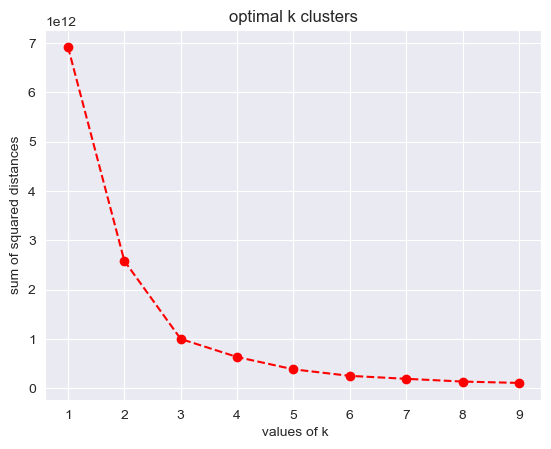

In [40]:
# getting the optimal k clusters by interia method
sum_of_squared_distances = []
k = range(1,10)
for num_clusters in k:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(cluster_df_new)
    sum_of_squared_distances.append(kmeans.inertia_)

plt.plot(k, sum_of_squared_distances, linestyle = '--', marker = 'o', color = 'red')
plt.xlabel(' values of k')
plt.ylabel('sum of squared distances')
plt.title('optimal k clusters')
plt.show()

/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

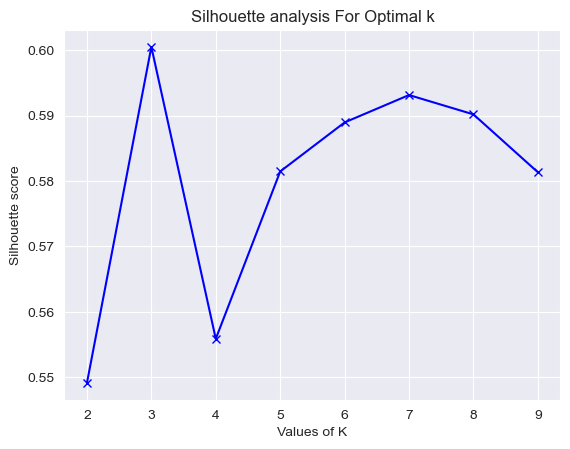

In [41]:
# getting the optimal number of clusters by Silhouette analysis method
from sklearn.metrics import silhouette_score
silhouette_avg = []
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(cluster_df_new)
    cluster_labels = kmeans.labels_
    silhouette_avg.append(silhouette_score(cluster_df_new, cluster_labels))
plt.plot(range_n_clusters, silhouette_avg, marker = 'x', color = 'blue')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [42]:
km=KMeans(n_clusters=3)
df_all_customers['cluster']=km.fit_predict(cluster_df_new)
df_all_customers.head(5)

/Users/ruonan/.conda/envs/scientificProject/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,person,discount_total_offers,discount_completion_pct,discount_min_completion_days,discount_max_completion_days,discount_completed_offers,discount_avg_completion_days,discount_avg_net_reward,bogo_total_offers,bogo_completion_pct,...,total_transactions,min_transaction_day,max_transaction_day,avg_transaction,total_transaction_amount,median_days_between_purchases,avg_days_between_purchases,bogo_completed_offers,bogo_min_completion_days,cluster
0,0009655768c64bdeb2e877511632db8f,1,1.0,0.0,0.0,1,0.0,-8.0,1,1.0,...,8,228,696,15.950000,127.60,27.0,58.50,1.0,6.0,1
0,00116118485d4dfda04fdbaba9a87b5c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,...,3,294,474,1.363333,4.09,18.0,60.00,0.0,NaN,1
0,0011e0d4e6b944f998e987f904e8c1e5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5,132,654,15.892000,79.46,66.0,104.40,NaN,NaN,1
0,0020c2b971eb4e9188eac86d93036a77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0.0,...,8,54,708,24.607500,196.86,21.0,81.75,0.0,NaN,0
0,0020ccbbb6d84e358d3414a3ff76cffd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,12,42,672,12.837500,154.05,30.0,52.50,NaN,NaN,1


In [43]:
df_all_customers['cluster'].value_counts(normalize= True)

1    0.496765
2    0.302176
0    0.201059
Name: cluster, dtype: float64

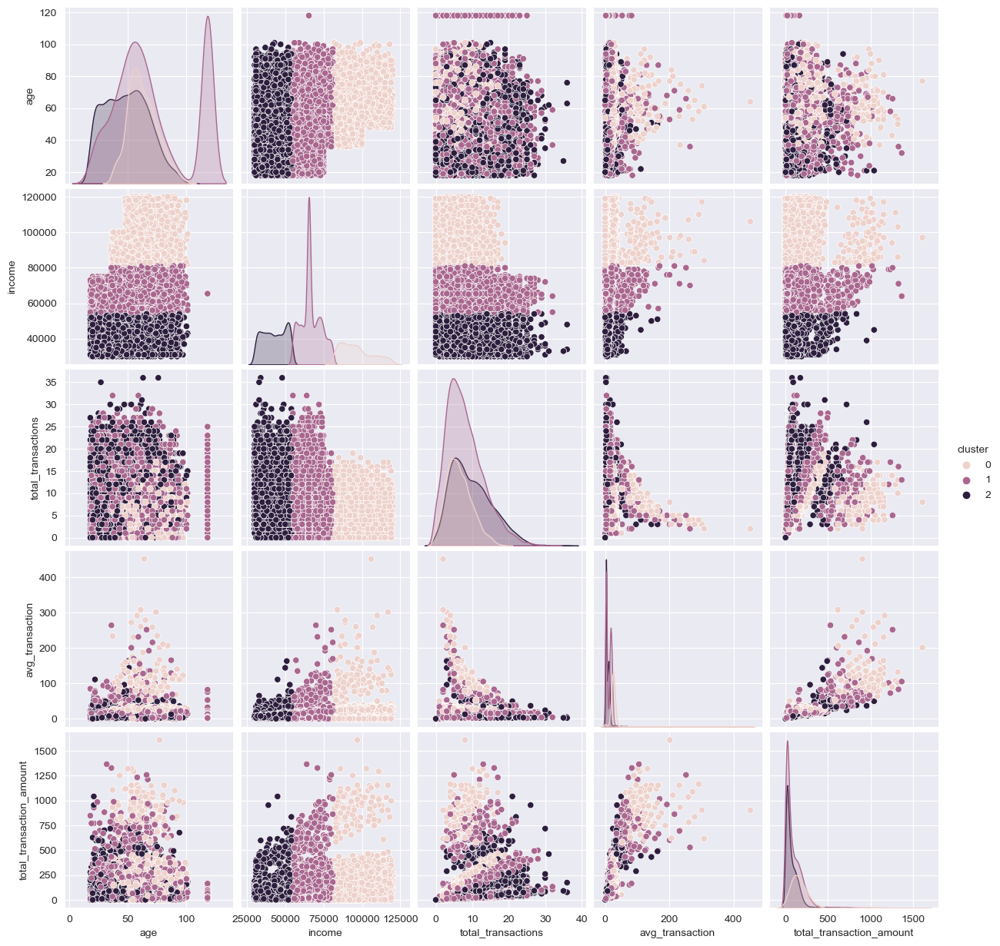

In [44]:
user_columns = ['age', 'gender', 'income', 'total_transactions', 'avg_transaction', 'total_transaction_amount', 'cluster']
user_attributes = sns.pairplot(df_all_customers[user_columns].fillna(0), hue = 'cluster')

In [56]:
clust_offer = pd.merge(offers_df, df_all_customers[['person','cluster']]).groupby(['cluster','offer_type','difficulty','reward'],as_index = False).agg({
    'CompletedOffer':['mean','sum'],
    'TimeToCompleteOffer':'mean',
    'NetReward':'max'
})
clust_offer.head()

cluster offer_type difficulty reward CompletedOffer       \
                                                 mean  sum   
0       0       bogo          5      5       0.515425  685   
1       0       bogo         10     10       0.524060  697   
2       0   discount          7      3       0.619048  390   
3       0   discount         10      2       0.554577  630   
4       0   discount         20      5       0.382900  206   

  TimeToCompleteOffer NetReward  
                 mean       max  
0            8.583942         0  
1            9.185079         0  
2            8.861538        -4  
3            8.771429        -8  
4            8.242718       -15

In [57]:
clust_offer.columns.droplevel(1)
clust_offer.columns = ['cluster','offer_type','difficulty','reward' , 'CompletedOffers','TotalCompletions','AvgTimeToCompleteOffer','NetReward']
clust_offer.head(5)

,cluster,offer_type,difficulty,reward,CompletedOffers,TotalCompletions,AvgTimeToCompleteOffer,NetReward
0,0,bogo,5,5,0.515425,685,8.583942,0
1,0,bogo,10,10,0.524060,697,9.185079,0
2,0,discount,7,3,0.619048,390,8.861538,-4
3,0,discount,10,2,0.554577,630,8.771429,-8
4,0,discount,20,5,0.382900,206,8.242718,-15


In [67]:
cluster0 = clust_offer[clust_offer['cluster']==0]
cluster1= clust_offer[clust_offer['cluster']==1]
cluster2 = clust_offer[clust_offer['cluster']==2]

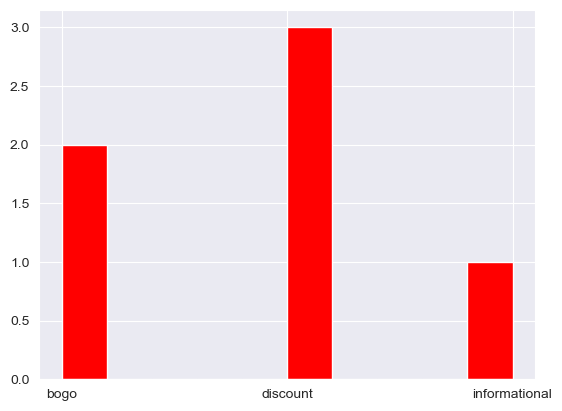

In [80]:
plt.hist(cluster0['offer_type'],color= 'red');

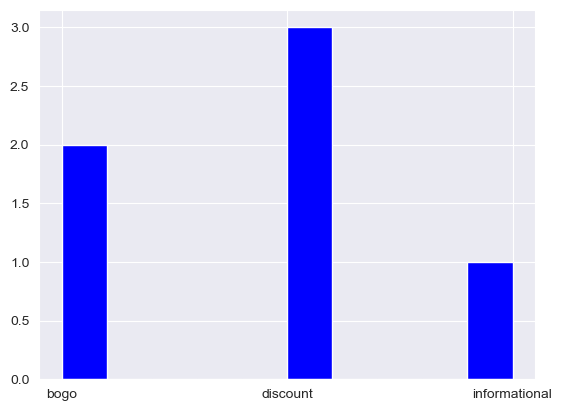

In [73]:
plt.hist(x=cluster1['offer_type'],color= 'blue');

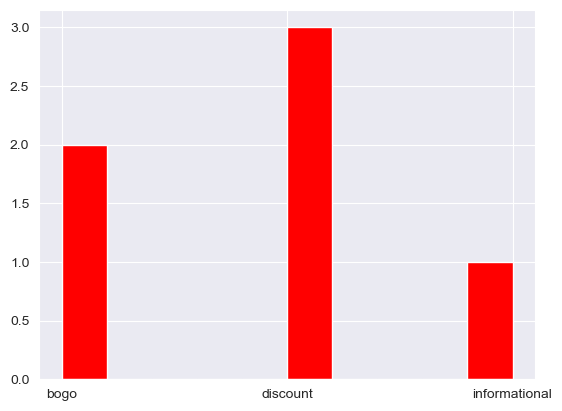

In [74]:
plt.hist(x=cluster2['offer_type'],color= 'red');

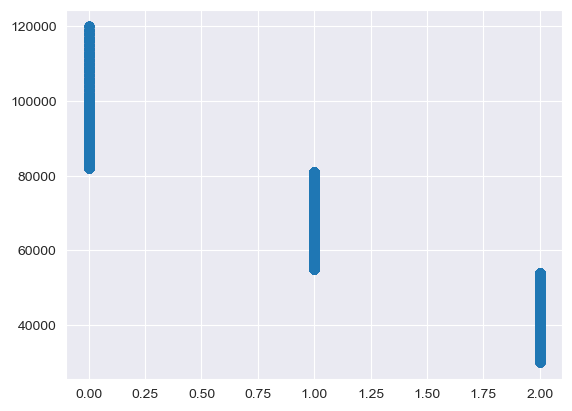

In [77]:
plt.scatter(x=df_all_customers['cluster'],y=df_all_customers['income'])

# 5.Conclusion

We use the KMeans cluster to classify customers into 3 categories,where the first category is for high income customers, the second category is for middle income customers, and the third category is for low income customers. From the sample data, the percentages of the three categories of income customers are 49.68%, 30.22% and 20.11% respectively. The higher income customers have a lower total number of transactions, but a higher average transaction amount and a higher total transaction amount.

And we also know the high income customers are more likely respond to the discount offer where the propobility is 30%.